## mounting Gdrive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Libraries


In [ ]:
!pip install noise

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.0/132.0 kB 3.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for noise: filename=noise-1.2.2-cp310-cp310-linux_x86_64.whl size=56275 sha256=799322ba7d393abe5769151145e2bd11f82d0a183e4d9ecdb7a560ec3c9d8f73
  Stored in directory: /root/.cache/pip/wheels/b2/01/64/ca2f6ed556c204d5ce2d3719a58757a5504aeb5525654692d0
Successfully built noise


In [ ]:
import os
import random
import zipfile
from glob import glob
from os import listdir
from time import time
from tqdm import tqdm
# Third-party imports
import cv2
import h5py
import matplotlib.pyplot as plt
import nibabel as nib
# import noise
import numpy as np
import pandas as pd
import pickle
import tensorflow as tf
from IPython import display
from IPython.display import clear_output
from tensorflow.keras import backend as K
from tensorflow.keras import metrics
from tensorflow.keras import layers
from tensorflow.keras.callbacks import CSVLogger, EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.layers import (Activation, BatchNormalization, Conv2D, Conv2DTranspose, Conv3D, Conv3DTranspose, ConvLSTM2D, Dense,
                                     Dropout, Flatten, Input, LeakyReLU, MaxPooling2D, MaxPooling3D, Reshape, UpSampling2D, add, concatenate)
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from tensorflow.keras.regularizers import l1_l2
from tensorflow.keras.optimizers import RMSprop, Adam, SGD, Adagrad, Adadelta

from numpy import asarray, savez_compressed, vstack
from PIL import Image
from scipy import ndimage
from skimage import data, filters
from skimage.io import imread, imshow, concatenate_images, imsave
from skimage.transform import resize
from sklearn.utils import class_weight
import keras


## Loading training data for GAN

In [ ]:

train_covid = np.load('/content/drive/MyDrive/Groupe1/GAN3DTrainingData/train_covid.npy')
train_control = np.load('/content/drive/MyDrive/Groupe1/GAN3DTrainingData/train_control.npy')

In [ ]:
print(train_control.shape,train_covid.shape)

(50, 32, 128, 128) (50, 32, 128, 128)


In [ ]:
train_covid = np.reshape(train_covid,(50,32,128,128,1))
print(train_covid.shape)

train_control = np.reshape(train_control,(50,32,128,128,1))
print(train_control.shape)

In [ ]:
for i in tqdm(range(train_covid.shape[0])): print(i)

## Model

In [ ]:
def generator_model(inputs,z, coef_filt):
    n = 1
    f_si = 3
    conv11 = Conv3D(8*n, (f_si, f_si, f_si), padding='same')(inputs)
    conv11 = LeakyReLU(alpha=0.3)(conv11)
    conc11 = concatenate([inputs, conv11], axis=4)

    conv12 = Conv3D(8*n, (f_si, f_si, f_si), padding='same')(conc11)
    conv12 = LeakyReLU(alpha=0.3)(conv12)

    conc12 = concatenate([inputs, conv12], axis=4)
    pool1 = MaxPooling3D(pool_size=(2, 2, 2))(conc12)

    conv21 = Conv3D(16*n, (f_si, f_si, f_si), padding='same')(pool1)
    conv21 = LeakyReLU(alpha=0.3)(conv21)

    conc21 = concatenate([pool1, conv21], axis=4)
    conv22 = Conv3D(16*n, (f_si, f_si, f_si), padding='same')(conc21)
    conv22 = LeakyReLU(alpha=0.3)(conv22)

    conc22 = concatenate([pool1, conv22], axis=4)
    pool2 = MaxPooling3D(pool_size=(2, 2, 2))(conc22)

    conv31 = Conv3D(32*n, (f_si, f_si, f_si), padding='same')(pool2)
    conv31 = LeakyReLU(alpha=0.3)(conv31)

    conc31 = concatenate([pool2, conv31], axis=4)
    conv32 = Conv3D(32*n, (f_si, f_si, f_si), padding='same')(conc31)
    conv32 = LeakyReLU(alpha=0.3)(conv32)

    conc32 = concatenate([pool2, conv32], axis=4)
    pool3 = MaxPooling3D(pool_size=(2, 2, 2))(conc32)

    conv41 = Conv3D(64*n, (f_si, f_si, f_si), padding='same')(pool3)
    conv41 = LeakyReLU(alpha=0.3)(conv41)

    conc41 = concatenate([pool3, conv41], axis=4)
    conv42 = Conv3D(64*n, (f_si, f_si, f_si), padding='same')(conc41)
    conv42 = LeakyReLU(alpha=0.3)(conv42)

    conc42 = concatenate([pool3, conv42], axis=4)
    pool4 = MaxPooling3D(pool_size=(2, 2, 2))(conc42)

    conv51 = Conv3D(128*n, (f_si, f_si, f_si), padding='same')(pool4)
    conv51 = LeakyReLU(alpha=0.3)(conv51)

    conc51 = concatenate([pool4, conv51], axis=4,name='HI')

    conc51_1 = concatenate([conc51, z], axis=4)

    conv51_1_1 = Conv3D(83, (1, 1, 1), padding='same')(conc51_1)
    conv51_1_1 = LeakyReLU(alpha=0.3)(conv51_1_1)

    conv51_1_2 = Conv3D(83, (3, 3, 3), padding='same')(conc51_1)
    conv51_1_2 = LeakyReLU(alpha=0.3)(conv51_1_2)

    conv51_1_3 = Conv3D(83, (5, 5, 5), padding='same')(conc51_1)
    conv51_1_3 = LeakyReLU(alpha=0.3)(conv51_1_3)

    conc51_2 = concatenate([conv51_1_1, conv51_1_2, conv51_1_3], axis=4,name="conection")


    conc51_3 = add([conc51,conc51_2])

    conv52 = Conv3D(128*n, (f_si, f_si, f_si), padding='same')(conc51_3)
    conv52 = LeakyReLU(alpha=0.3)(conv52)

    conc52 = concatenate([pool4, conv52], axis=4)

    up6 = concatenate([Conv3DTranspose(256, (2, 2, 2), strides=(2, 2, 2), padding='same')(conc52), conc42], axis=4)
    conv61 = Conv3D(64*n, (f_si, f_si, f_si), padding='same')(up6)
    conv61 = LeakyReLU(alpha=0.3)(conv61)

    conc61 = concatenate([up6, conv61], axis=4)
    conv62 = Conv3D(64*n, (f_si, f_si, f_si), padding='same')(conc61)
    conv62 = LeakyReLU(alpha=0.3)(conv62)

    conc62 = concatenate([up6, conv62], axis=4)


    up7 = concatenate([Conv3DTranspose(128, (2, 2, 2), strides=(2, 2, 2), padding='same')(conc62), conv32], axis=4)
    conv71 = Conv3D(32*n, (f_si, f_si, f_si), padding='same')(up7)
    conv71 = LeakyReLU(alpha=0.3)(conv71)

    conc71 = concatenate([up7, conv71], axis=4)
    conv72 = Conv3D(32*n, (f_si, f_si, f_si), padding='same')(conc71)
    conv72 = LeakyReLU(alpha=0.3)(conv72)

    conc72 = concatenate([up7, conv72], axis=4)

    up8 = concatenate([Conv3DTranspose(64, (2, 2, 2), strides=(2, 2, 2), padding='same')(conc72), conv22], axis=4)
    conv81 = Conv3D(16*n, (f_si, f_si, f_si), padding='same')(up8)
    conv81 = LeakyReLU(alpha=0.3)(conv81)

    conc81 = concatenate([up8, conv81], axis=4)
    conv82 = Conv3D(16*n, (f_si, f_si, f_si), padding='same')(conc81)
    conv82 = LeakyReLU(alpha=0.3)(conv82)

    conc82 = concatenate([up8, conv82], axis=4)
    print(Conv3DTranspose(128, (2, 2, 2), strides=(2, 2, 2), padding='same')(conc82).shape,conv12.shape)

    up9 = concatenate([Conv3DTranspose(32, (2, 2, 2), strides=(2, 2, 2), padding='same')(conc82), conv12], axis=4)
    conv91 = Conv3D(8*n, (f_si, f_si, f_si), padding='same')(up9)
    conv91 = LeakyReLU(alpha=0.3)(conv91)

    conc91 = concatenate([up9, conv91], axis=4)
    conv92 = Conv3D(8*n, (f_si, f_si, f_si), padding='same')(conc91)
    conv92 = LeakyReLU(alpha=0.3)(conv92)
    conc92 = concatenate([up9, conv92], axis=4)
    conv10 = Conv3D(1, (1, 1, 1),activation='relu')(conc92)
    return conv10

In [ ]:
def discriminator_model(inputs):
    x = layers.Conv3D(filters=16, kernel_size=3)(inputs)
    x = Activation('relu')(x)
    x = layers.MaxPool3D(pool_size=2)(x)

    x = layers.Conv3D(filters=32, kernel_size=3)(inputs)
    x = Activation('relu')(x)
    x = layers.MaxPool3D(pool_size=2)(x)

    x = layers.Conv3D(filters=64, kernel_size=3)(x)
    x = Activation('relu')(x)
    x = layers.MaxPool3D(pool_size=2)(x)

    x = layers.Conv3D(filters=128, kernel_size=3)(x)
    x = Activation('relu')(x)
    x = layers.MaxPool3D(pool_size=2)(x)

    x = layers.GlobalAveragePooling3D()(x)
    x = layers.Dense(units=32)(x)
    x = Activation('relu')(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(units=16)(x)
    x = Activation('relu')(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(units=8)(x)
    x = Activation('relu')(x)
    outputs = layers.Dense(units=2, activation="softmax")(x)
    return outputs

## Preparing for training

In [ ]:
def make_trainable(model, trainable):
    """ Helper to freeze / unfreeze a model """
    model.trainable = trainable
    for l in model.layers:
        l.trainable = trainable

In [ ]:
input_depth = 32
input_rows = 128
input_columns = 128

from keras.optimizers import legacy

# Use legacy version of the Adam optimizer
optimizer = legacy.Adam(learning_rate=1e-3)
print('\nGenerator')
input_img = Input(shape=(input_depth, input_rows, input_columns, 1))
g_input = Input(shape=[2, 8, 8, 10])
n = Input(shape=(input_depth, input_rows, input_columns, 1))
g_output = generator_model(input_img, g_input, n)  # Ensure this function is defined and uses tf.keras layers
generator = Model(inputs=[input_img, g_input, n], outputs=g_output)
print(generator.summary())

print('\nDiscriminator')
d_input = Input(shape=(input_depth, input_rows, input_columns, 1))
d_output = discriminator_model(d_input)  # Ensure this function is defined and uses tf.keras layers
discriminator = Model(d_input, d_output)
print(discriminator.summary())

generator.compile(optimizer=optimizer, loss='binary_crossentropy')
discriminator.compile(loss='mse', optimizer=optimizer, metrics=['accuracy'])

In [ ]:
ntrain = 5
ntest = 5

trainidx = random.sample(range(80), ntrain)
XTr = train_control[trainidx,:,:,:,:]

testidx = random.sample(range(80, 100), ntest)
XTe = train_control[testidx,:,:,:,:]

trainidx = random.sample(range(80), ntrain)
GXTr = train_covid[trainidx,:,:,:,:]

testidx = random.sample(range(80,100), ntest)
GXTe = train_covid[testidx,:,:,:,:]




noise_gen_train = np.random.uniform(-0.5,0.5,size=[GXTr.shape[0],2,8,8,10])
noise_gen_test = np.random.uniform(-0.5,0.5,size=[GXTe.shape[0],2,8,8,10])

n = np.ones((5,32,128,128,1))
generated_images_train = generator.predict([GXTr,noise_gen_train,n])
generated_images_test = generator.predict([GXTe,noise_gen_test,n])

print("XTr shape:", XTr.shape)
print("generated_images_train shape:", generated_images_train.shape)
print("generated_images_test shape:", generated_images_test.shape)


Xtr = np.concatenate((XTr, generated_images_train))
n = XTr.shape[0]
ytr = np.zeros([2*n,2])
ytr[:n,1] = 1
ytr[n:,0] = 1


Xte = np.concatenate((XTe, generated_images_test))
n = XTe.shape[0]
yte = np.zeros([2*n,2])
yte[:n,1] = 1
yte[n:,0] = 1

make_trainable(discriminator,True)
print(Xtr.shape)
print(ytr.shape)
print(Xte.shape)
print(yte.shape)

discriminator.fit(Xtr, ytr, batch_size=5,epochs=1,verbose=1,validation_data=(Xte, yte))

1/1 [==============================] - 0s 33ms/step
XTr shape: (5, 32, 128, 128, 1)
generated_images_train shape: (5, 32, 128, 128, 1)
generated_images_test shape: (5, 32, 128, 128, 1)
(10, 32, 128, 128, 1)
(10, 2)
(10, 32, 128, 128, 1)
(10, 2)
2/2 [==============================] - 4s 394ms/step - loss: 0.2580 - accuracy: 0.5000 - val_loss: 0.2521 - val_accuracy: 0.5000


In [ ]:
def plot_loss(losses):
    plt.figure(figsize=(10,8))
    plt.plot(losses["d"][:], label='discriminitive loss')
    plt.plot(losses["g"][:], label='generative loss')
    plt.legend()
    plt.show()

def plot_gen(n_ex=8,dim=(2,8), figsize=(10,10),coef_filt=1):
    for num in [95,98]:
        noise = train_covid[num:num+1,:,:,:,:]
        noise_gen_test = np.random.uniform(-0.5,0.5,size=[1,2,8,8,10])
        n = coef_filt*np.ones((1,32,128,128,1))
        # Check if any of the arrays are empty and skip if so
        if noise.size == 0 or noise_gen_test.size == 0 or n.size == 0:
            continue
        generated_images = generator.predict([noise,noise_gen_test,n])
        plt.figure(figsize=figsize)
        for i in range(generated_images.shape[0]):

            n = int(20)
            img = generated_images[i,n,:,:,0]

            plt.subplot(1,3,1)
            plt.imshow(noise[i,n,:,:,0])
            plt.axis('off')

            plt.subplot(1,3,2)
            plt.imshow(img)
            plt.axis('off')

            plt.subplot(1,3,3)
            plt.imshow(noise[i,n,:,:,0] - img)
            plt.axis('off')

        plt.tight_layout()
        plt.show()

losses = {"d":[], "g":[]}

In [ ]:
def GAN_gen(my_data,my_model):
    '''
    size in and out = 1,32,128,128,1
    '''
    # noise_gen_Trr = per_noise_gen(batch_size=1)
    noise_gen_Trr = np.random.uniform(-0.5,0.5,size=[1,2,8,8,10])

    randomness  = 1*np.random.rand(1,1)[0][0]
    n = randomness*np.ones((1,32,128,128,1))
    my_out = generator.predict([my_data,noise_gen_Trr,n])
    return my_out

In [ ]:
def prediction_GAN():
    gan_out = np.zeros((1*train_covid.shape[0],train_covid.shape[1],train_covid.shape[2],train_covid.shape[3],1)) # 4: four models

    for i in tqdm(range(train_covid.shape[0])):
        if(i<100):
            gan_out[i:i+1] = GAN_gen(train_covid[i:i+1],generator_model)
        else:
            gan_out[i:i+1] = train_covid[i:i+1]
    return gan_out

In [ ]:
ntrain = 5
# Set up GAN by stacking the discriminator on top of the generator
print('\nGenerative Adversarial Network')
input_depth=32
input_rows=128
input_columns=128
#Encoder
gan_input = Input(shape=(input_depth, input_rows, input_columns, 1))
g_input = Input(shape=[2,8,8,10])

n =  Input(shape=(32,128,128,1))
gan_output = discriminator(generator([gan_input,g_input,n]))
GAN = Model(inputs = [gan_input,g_input,n], outputs = gan_output)
print(GAN.summary())

initial_learning_rate = 0.00005

g_opt = Adam(learning_rate= initial_learning_rate)

GAN.compile(optimizer=optimizer, loss='binary_crossentropy')
generator.compile(loss='mse', optimizer=g_opt)



Generative Adversarial Network
Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_5 (InputLayer)        [(None, 32, 128, 128, 1)]    0         []                            
                                                                                                  
 input_6 (InputLayer)        [(None, 2, 8, 8, 10)]        0         []                            
                                                                                                  
 input_7 (InputLayer)        [(None, 32, 128, 128, 1)]    0         []                            
                                                                                                  
 model (Functional)          (None, 32, 128, 128, 1)      7861643   ['input_5[0][0]',             
                                                            


## Training


In [ ]:
def add_noise(input_array):
    shape = (128,128)
    scale = np.random.randint(10,30)
    octaves = 10
    persistence = 0.01*np.random.randint(-50,50)
    lacunarity = 2.0
    seed = np.random.randint(0,1000)
    world = np.zeros(shape)
    for i in range(shape[0]):
        for j in range(shape[1]):
            world[i][j] = noise.pnoise2(i/scale,
                                        j/scale,
                                        octaves=octaves,
                                        persistence=persistence,
                                        lacunarity=lacunarity,
                                        repeatx=140,
                                        repeaty=140,
                                        base=seed)
    return cv2.addWeighted(input_array, 1, world, 1, 0)

def add_noise_3d(input_array):
    # input size: 5,32,128,128,1
    output_array = input_array.copy()
    my_rand = random.sample(range(0,32), 8)
    for i in range(input_array.shape[0]):
        my_rand = random.sample(range(0,32), 8)
        for j in my_rand:
            output_array[i,j,:,:,0] = add_noise(input_array[i,j,:,:,0])
    return output_array

In [ ]:
# Download url of normal CT scans.
url = "https://github.com/hasibzunair/3D-image-classification-tutorial/releases/download/v0.2/CT-0.zip"
filename = os.path.join("/content/drive/MyDrive/Groupe1/", "CT-0.zip")
keras.utils.get_file(filename, url)

1065471431/1065471431 [==============================] - 5s 0us/step


'/content/drive/MyDrive/Groupe1/CT-0.zip'

In [ ]:
def train_for_n(nb_epoch, plt_frq,BATCH_SIZE,con_num,cov_num,ae_rate = 4,yorno=0):
    for e in (range(nb_epoch)):
        D_losss = []
        A_losss = []
        if (e%ae_rate == 0 ):
            trainidx = random.sample(range(0,con_num), BATCH_SIZE)
            clean_gen = train_control[trainidx,:,:,:,:]
            # clean_gen2 = per_noise_gen(clean_gen)
            clean_gen2 = add_noise_3d(clean_gen)
            noise_gen_Trr = np.random.uniform(-0.5,0.5,size=[BATCH_SIZE,2,8,8,10])
            n = np.ones((BATCH_SIZE,32,128,128,1))
            generator.train_on_batch([clean_gen2,noise_gen_Trr,n], clean_gen)

        trainidx = random.sample(range(0,cov_num), BATCH_SIZE)
        noise_gen = train_covid[trainidx,:,:,:,:]
        noise_gen_Trr = np.random.uniform(-0.5,0.5,size=[BATCH_SIZE,2,8,8,10])
        n = np.ones((BATCH_SIZE,32,128,128,1))
        generated_images = generator.predict([noise_gen,noise_gen_Trr,n])

        # Train discriminator on generated images
        trainidx = random.sample(range(0,con_num), BATCH_SIZE)
        image_batch = train_control[trainidx,:,:,:,:]
        X = np.concatenate((image_batch, generated_images))
        y = np.zeros([2*BATCH_SIZE,2])
        y[0:BATCH_SIZE,1] = 1
        y[BATCH_SIZE:,0] = 1
        make_trainable(discriminator,True)
        # print(y.shape)
        d_loss  = discriminator.train_on_batch(X,y)
        a,b = discriminator.evaluate(X,y,verbose=0)
        D_losss.append(a)
        A_losss.append(b)
        losses["d"].append(d_loss[0])

        # train Generator-Discriminator stack on input noise to non-generated output class
        noise_tr_dc = np.random.uniform(-0.5,0.5,size=[BATCH_SIZE,2,8,8,10])

        noise_tr = random.sample(range(0,cov_num), BATCH_SIZE)

        noise_tr = train_covid[noise_tr,:,:,:,:]
        y2 = np.zeros([BATCH_SIZE,2])
        y2[:,1] = 1

        make_trainable(discriminator,False)
        n = 1*np.ones((BATCH_SIZE,32,128,128,1))

        g_loss = GAN.train_on_batch([noise_tr,noise_tr_dc,n], y2 )
        losses["g"].append(g_loss)

        # Updates plots
        if e%plt_frq==plt_frq-1:
            generator.save('/content/drive/MyDrive/Groupe1/trained_models/generator_model', save_format='h5')
            discriminator.save('/content/drive/MyDrive/Groupe1/trained_models/discriminator_model', save_format='h5')
            clear_output()
            plot_loss(losses)
            plot_gen()






In [ ]:
train_for_n(nb_epoch=1600,
            plt_frq=1,
            BATCH_SIZE=5,
            con_num=100,
            cov_num=100,
            ae_rate=1)

## Final

# Visualization of some examples

In [ ]:
def reshaping_bcdunet(inp):
    '''
    size = b,32,128,128,1
    out = b*32,128,128,1
    '''
    output = np.zeros((0,128,128,1))
    for i in tqdm(range(inp.shape[0])):
        inp[i,:,:,:,:] = (inp[i,:,:,:,:] - np.amin(inp[i,:,:,:,:]))/(np.max(inp[i,:,:,:,:]) - np.min(inp[i,:,:,:,:]))
        output = np.append(output,inp[i,:,:,:,:],axis = 0)
    return output

In [ ]:
import tensorflow
generator = tensorflow.keras.models.load_model('/content/drive/MyDrive/Groupe1/trained_models/generator_model_given')

In [ ]:
def GAN_gen(my_data,my_model):
    '''
    size in and out = 1,32,128,128,1
    '''
    # noise_gen_Trr = per_noise_gen(batch_size=1)
    noise_gen_Trr = np.random.uniform(-0.5,0.5,size=[1,2,8,8,10])

    randomness  = 1*np.random.rand(1,1)[0][0]
    n = randomness*np.ones((1,32,128,128,1))
    my_out = generator.predict([my_data,noise_gen_Trr,n])
    return my_out

In [ ]:
from tqdm import tqdm

def prediction_GAN():
    gan_out = np.zeros((1*train_covid.shape[0],train_covid.shape[1],train_covid.shape[2],train_covid.shape[3],1)) # 4: four models

    for i in tqdm(range(train_covid.shape[0])):
        if(i<50):
            gan_out[i:i+1] = GAN_gen(train_covid[i:i+1],generator)
        else:
            gan_out[i:i+1] = train_covid[i:i+1]
    return gan_out

In [ ]:
dis1 = reshaping_bcdunet(train_covid)

print(dis1.shape)
gan_out = prediction_GAN()

print(type(gan_out))
out = reshaping_bcdunet(gan_out)


In [ ]:

np.save('/content/drive/MyDrive/Groupe1/input_output_gan3D/output_lung_gen.npy', out)
np.save('/content/drive/MyDrive/Groupe1/input_output_gan3D/input_lung.npy', dis1)

<ipython-input-35-bedf18eb09a6>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(19,19))


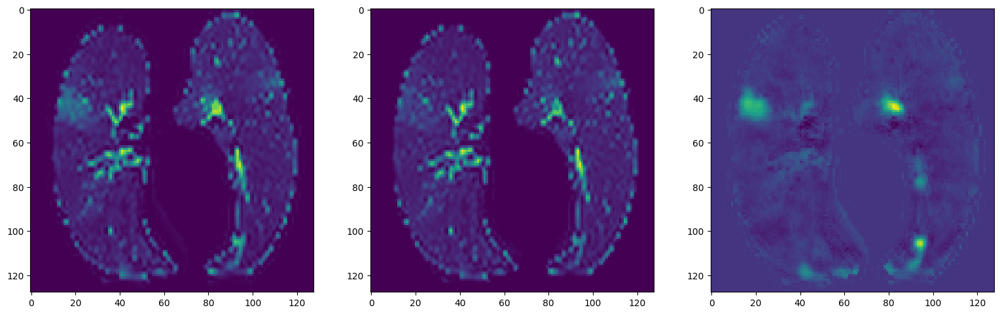

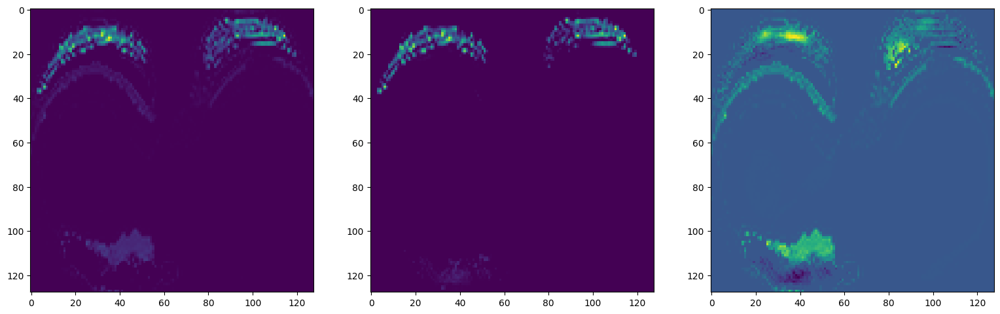

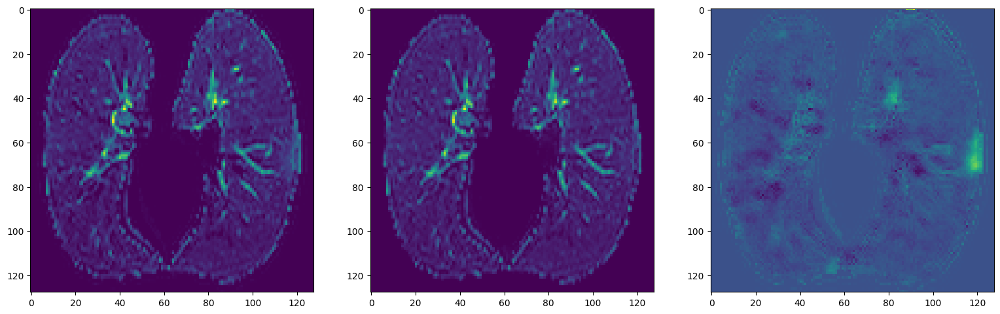

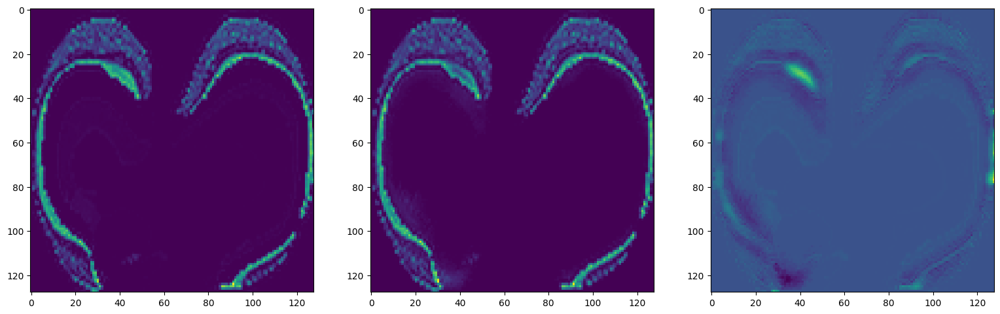

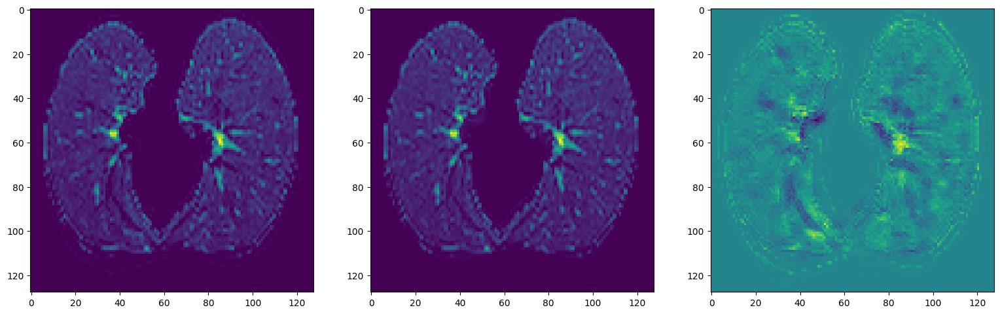

...

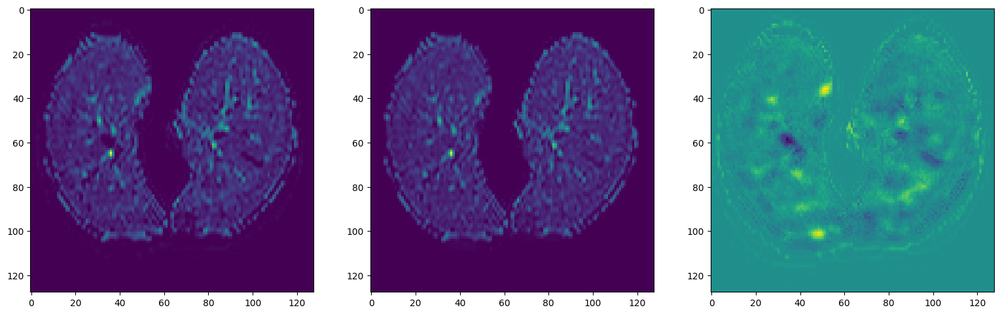

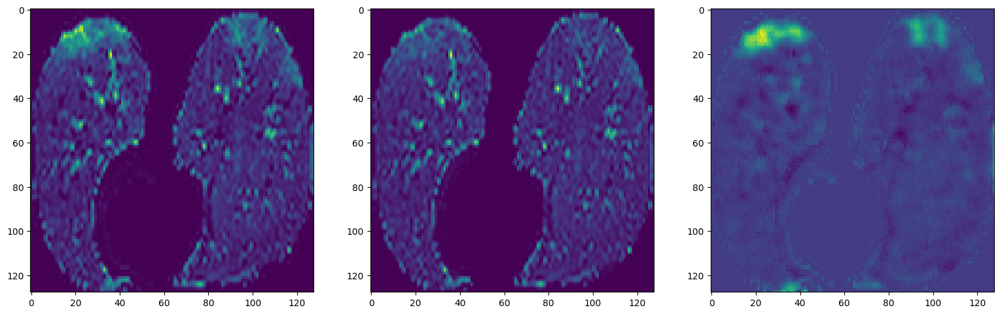

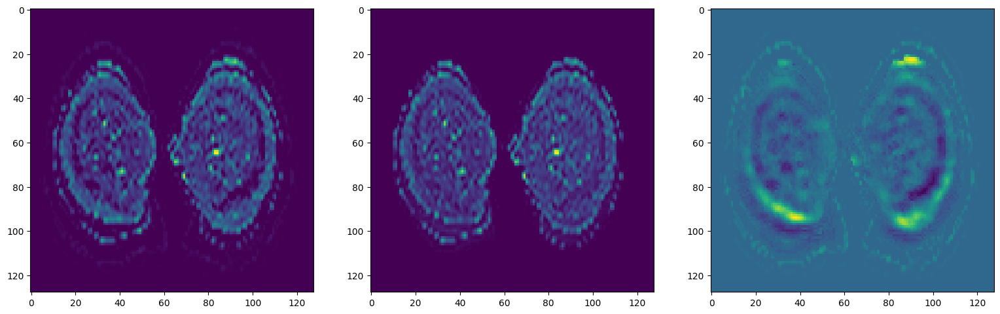

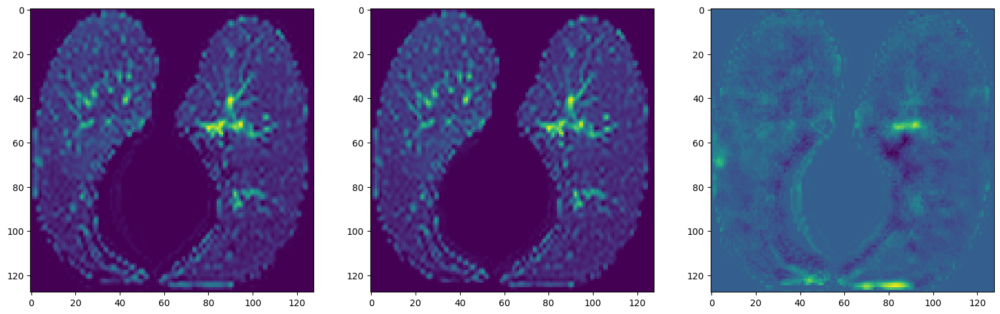

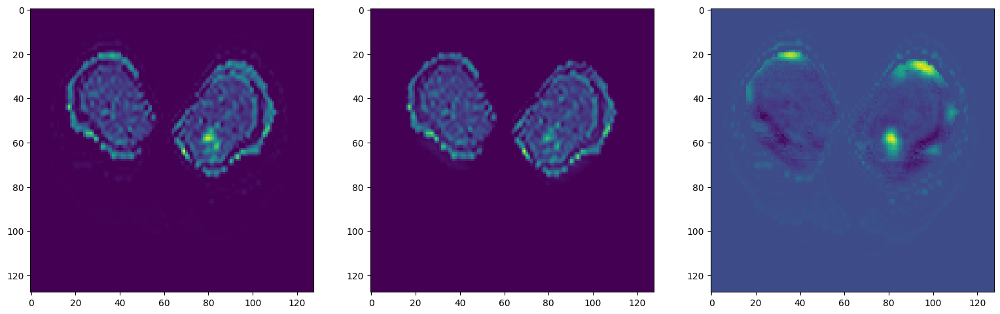

In [ ]:
# we select some samples to show some different slices from different cases
for i in [j for j in range(17, 1600, 17)]:
    plt.figure(figsize=(19,19))
    plt.subplot(131)
    plt.imshow(dis1[i,:,:,0])

    plt.subplot(132)
    plt.imshow(out[i,:,:,0])

    plt.subplot(133)
    plt.imshow(dis1[i,:,:,0] - out[i,:,:,0])

In [ ]:
!pip list